In [1]:
################################################################################
##############    Classification: Logistic Regression - kNN    #################
################################################################################
### Load necessary modules -------------------------------
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
plt.style.use('ggplot')
import numpy as np
import math

import neuralsens as ns

from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.pipeline import Pipeline
from sklearn.neural_network import MLPClassifier
from sklearn.preprocessing import StandardScaler
import sklearn.metrics as mtrs
# Multicolor line
import matplotlib.collections 

from sklearn.calibration import calibration_curve
import matplotlib.lines as mlines
import matplotlib.transforms as mtransforms

from sklearn import preprocessing
import math
import ClassificationTools as CT
from statsmodels.stats import contingency_tables as cont_tab
from scipy.stats import binom_test
import warnings

In [2]:
### Load file --------------------------------------------
df = pd.read_csv('TrainingSet1001_MIC.dat', sep = " ")
out = df['Y'].copy()
df['Y'] = df['X1'] + df['X3'] ** 2 - df['X5'] + abs(df['X8']) - abs(df['X10'])
out[:] = 'NOONE'
out[df['Y'] > 3] = 'SUPER'
out[df['Y'] < 0.5] = 'LOWER'
df['Y'] = out
df.head()

,X1,X2,X3,X4,X5,X6,X7,X8,X9,X10,Y
0,3.290968,0.644549,0.713098,1.948699,1.020626,0.170077,2.868211,3.647116,0.066560,-0.706168,SUPER
1,3.100687,-0.782135,0.401693,0.193084,0.908419,1.165997,-0.041028,-2.850352,-2.535893,5.036424,LOWER
2,-0.974291,0.881651,0.690685,-0.560430,-0.634730,-0.664597,6.635579,-0.973682,-1.267142,4.450237,LOWER
3,-3.414938,-0.203968,-0.036549,-2.261589,-1.296119,-2.126754,-2.059090,5.354376,-0.112499,2.257196,NOONE
4,4.798085,-0.276071,-0.964808,0.355198,1.826178,-0.640231,-2.650546,0.364302,-0.325046,3.663908,NOONE


In [3]:
### Convert output variable to factor
df.Y = df.Y.astype('category')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1001 entries, 0 to 1000
Data columns (total 11 columns):
 #   Column  Non-Null Count  Dtype   
---  ------  --------------  -----   
 0   X1      1001 non-null   float64 
 1   X2      1001 non-null   float64 
 2   X3      1001 non-null   float64 
 3   X4      1001 non-null   float64 
 4   X5      1001 non-null   float64 
 5   X6      1001 non-null   float64 
 6   X7      1001 non-null   float64 
 7   X8      1001 non-null   float64 
 8   X9      1001 non-null   float64 
 9   X10     1001 non-null   float64 
 10  Y       1001 non-null   category
dtypes: category(1), float64(10)
memory usage: 79.4 KB


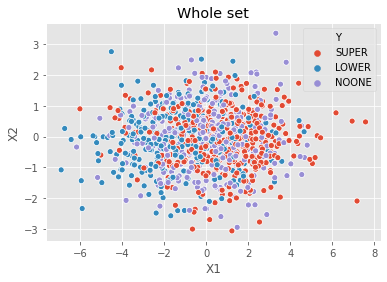

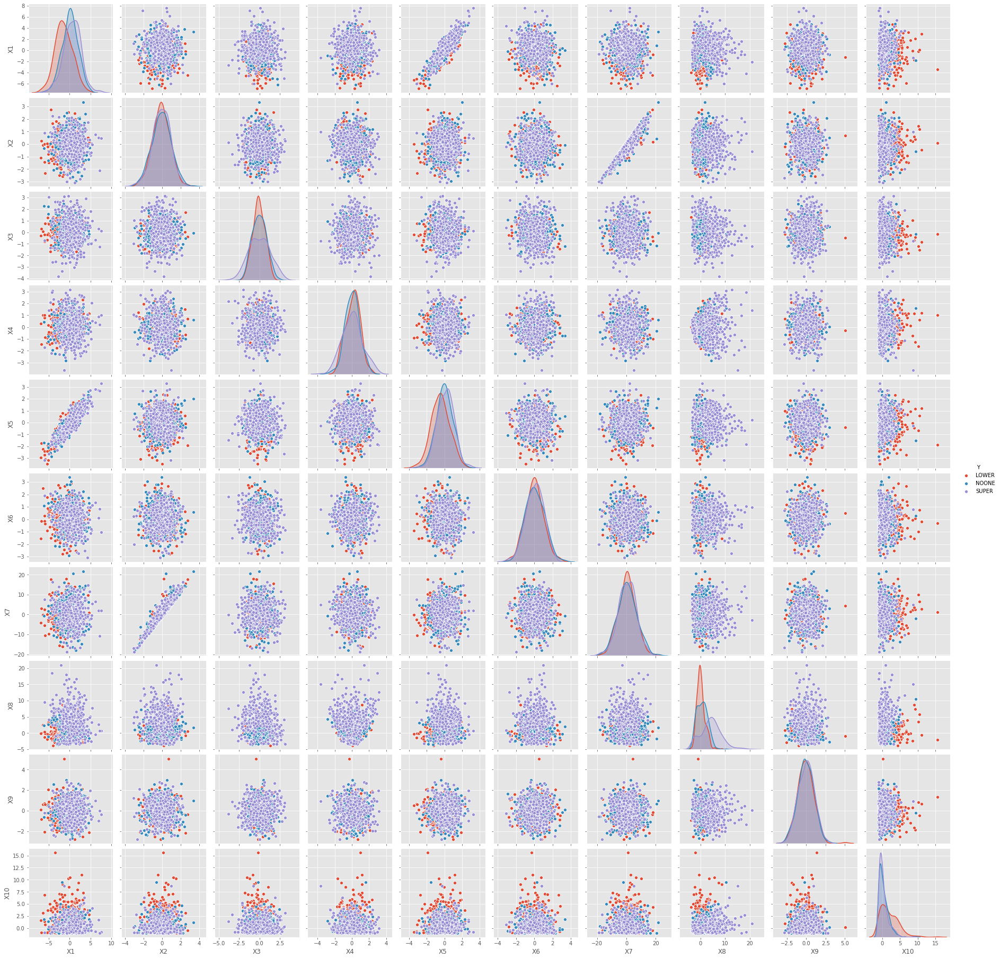

In [4]:
### Exploratory analysis -------------------------------------------------------------------------------------
sns.scatterplot(x = 'X1', y = 'X2', hue = 'Y', data = df).set_title("Whole set")
plt.show()
sns.pairplot(df, hue = 'Y')
plt.show()

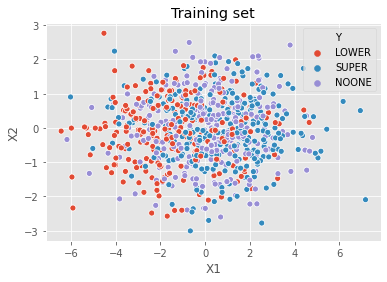

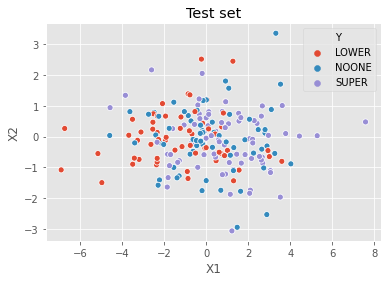

In [5]:
X = df[['X1','X2','X3','X4','X5','X6','X7','X8','X9','X10']]
y = df['Y']
## Divide the data into training and test sets ---------------------------------------------------
## Create random 80/20 % split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 5, stratify = y)

## Create dataset to store model predictions
dfTR_eval = X_train.copy()
dfTR_eval['Y'] = y_train
dfTS_eval = X_test.copy()
dfTS_eval['Y'] = y_test

## plot training and test sets. 
## Try changing the value inside set.seed(). How does it affect the selected data?
sns.scatterplot(x = 'X1', y = 'X2', hue = 'Y', data = dfTR_eval).set_title("Training set")
plt.show()
sns.scatterplot(x = 'X1', y = 'X2', hue = 'Y', data = dfTS_eval).set_title("Test set")
plt.show()



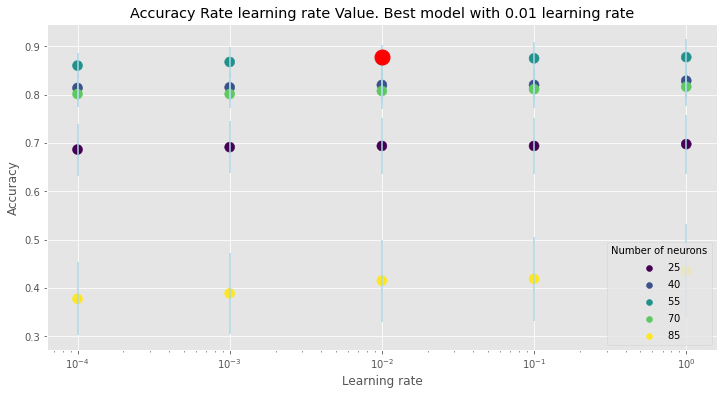

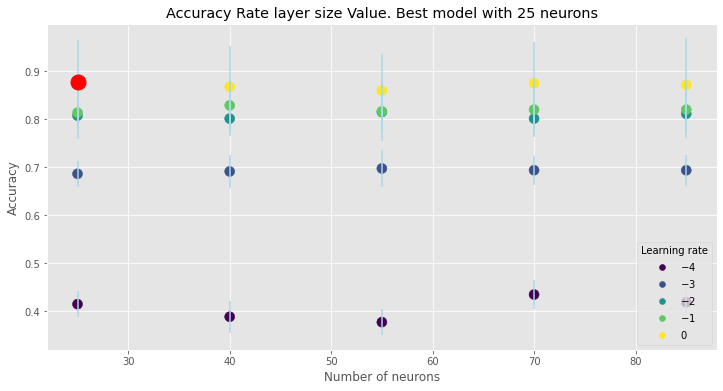

In [6]:
#-------------------------------------------------------------------------------------------------
#------------------------------- MLP Class MODEL -------------------------------------------------
#-------------------------------------------------------------------------------------------------
param = {'MLP__learning_rate_init': [0.0001,0.001,0.01,0.1,1], # Initial value of learning rate 
         'MLP__hidden_layer_sizes':[(25,),(40,),(55,),(70,),(85,)]} # Number of neurons in each hidden layer, enters as tuples
pipe = Pipeline(steps=[('scaler', StandardScaler()), 
                       ('MLP', MLPClassifier(solver='adam', # Update function
                                             activation='logistic', # Logistic sigmoid activation function
                                             alpha=0.01, # L2 regularization term
                                             learning_rate='adaptive', # Type of learning rate used in training
                                             max_iter=250, # Maximum number of iterations
                                             batch_size=10, # Size of batch when training
                                             tol=1e-4, # Tolerance for the optimization
                                             validation_fraction=0.0, # Percentage of samples used for validation
                                             n_iter_no_change=10, # Maximum number of epochs to not meet tol improvement
                                             random_state=150))]) # For replication

# We use Grid Search Cross Validation to find the best parameter for the model in the grid defined 
nFolds = 10
MLP_fit = GridSearchCV(estimator=pipe, # Structure of the model to use
                       param_grid=param, # Defined grid to search in
                       n_jobs=-1, # Number of cores to use (parallelize)
                       cv=nFolds) # Number of Folds 
MLP_fit.fit(X_train, y_train) # Search in grid

# Plot the cross validation score (accuracy) in the Grid Search
nFolds = 10
cv_errors = np.empty([nFolds,len(MLP_fit.cv_results_['split0_test_score'])])
for split in range(nFolds):
    cv_errors[split,:] = MLP_fit.cv_results_['split' + str(split) + '_test_score']
meanAcc = cv_errors.mean(0)
stdAcc = cv_errors.std(0)

scores_MLP = meanAcc # Store cv-scores for later

plt.figure(figsize=(12, 6))
plt.errorbar(MLP_fit.cv_results_['param_MLP__learning_rate_init'], 
             [x for _,x in sorted(zip(MLP_fit.cv_results_['param_MLP__learning_rate_init'],meanAcc))], 
             yerr=[x for _,x in sorted(zip(MLP_fit.cv_results_['param_MLP__learning_rate_init'],stdAcc))], 
             linestyle="None", ecolor='lightblue')
sct = plt.scatter(MLP_fit.cv_results_['param_MLP__learning_rate_init'], 
            [x for _,x in sorted(zip(MLP_fit.cv_results_['param_MLP__learning_rate_init'],meanAcc))], 
            c=[a[0] for a in MLP_fit.cv_results_['param_MLP__hidden_layer_sizes']],s=100)
plt.legend(*sct.legend_elements(), loc="lower right", title="Number of neurons")
plt.plot(MLP_fit.best_params_['MLP__learning_rate_init'], MLP_fit.best_score_,marker='o', markersize=15, color='red')
plt.title('Accuracy Rate learning rate Value. Best model with ' + str(MLP_fit.best_params_['MLP__learning_rate_init']) + ' learning rate')
plt.xlabel('Learning rate')
plt.ylabel('Accuracy')
plt.xscale('log')
plt.show()

plt.figure(figsize=(12, 6))
plt.errorbar([a[0] for a in MLP_fit.cv_results_['param_MLP__hidden_layer_sizes']], 
             [x for _,x in sorted(zip([a[0] for a in MLP_fit.cv_results_['param_MLP__hidden_layer_sizes']],meanAcc))], 
             yerr=[x for _,x in sorted(zip([a[0] for a in MLP_fit.cv_results_['param_MLP__hidden_layer_sizes']],stdAcc))], 
             linestyle="None", ecolor='lightblue')
sct = plt.scatter([a[0] for a in MLP_fit.cv_results_['param_MLP__hidden_layer_sizes']], 
            [x for _,x in sorted(zip([a[0] for a in MLP_fit.cv_results_['param_MLP__hidden_layer_sizes']],meanAcc))], 
            c=np.log10(np.array([a for a in MLP_fit.cv_results_['param_MLP__learning_rate_init']],dtype=float)),s=100)
plt.legend(*sct.legend_elements(), loc="lower right", title="Learning rate")
plt.plot(MLP_fit.best_params_['MLP__hidden_layer_sizes'][0], MLP_fit.best_score_,marker='o', markersize=15, color='red')
plt.title('Accuracy Rate layer size Value. Best model with ' + str(MLP_fit.best_params_['MLP__hidden_layer_sizes'][0]) + ' neurons')
plt.xlabel('Number of neurons')
plt.ylabel('Accuracy')
plt.show()


In [7]:
mlp = MLP_fit.best_estimator_['MLP']
wts = mlp.coefs_
bias = mlp.intercepts_
actfunc = ['identity',MLP_fit.best_estimator_['MLP'].get_params()['activation'],mlp.out_activation_]
X = X_train
y = y_train
sens_end_layer = 'last'
sens_end_input = False
sens_origin_layer = 0
sens_origin_input = True

In [8]:
sensmlp = ns.SensAnalysisMLP(wts, bias, actfunc, X, y)

In [9]:
sensmlp.summary()

Sensitivity analysis of [10, 25, 3] MLP network.

Sensitivity measures of each output:

$Y_LOWER 

         mean       std  mean_squared
X1   8.843655  8.475278    150.040575
X2   0.374057  0.700223      0.630231
X3   2.068232  7.042652     53.876535
X4  -1.009592  1.083180      2.192555
X5  -4.064407  4.255392     34.627762
X6   0.336968  1.036764      1.188427
X7  -0.274376  1.011321      1.098052
X8   3.693133  9.755331    108.805720
X9   0.303241  0.752289      0.657895
X10 -5.532935  5.253582     58.213496


$Y_SUPER 

         mean       std  mean_squared
X1  -0.506752  1.593652      2.796524
X2  -0.029710  0.110543      0.013102
X3  -0.206547  1.001186      1.045034
X4   0.061459  0.179083      0.035848
X5   0.215735  0.768126      0.636559
X6  -0.018342  0.107656      0.011926
X7   0.037112  0.127173      0.017550
X8  -0.319026  1.788464      3.300380
X9  -0.025045  0.095115      0.009674
X10  0.250036  0.834769      0.759358


$Y_NOONE 

         mean       std  mean_squared
X

In [10]:
sensmlp.info()

Sensitivity analysis of [10, 25, 3] MLP network.

800 samples

Sensitivities of each output (only 5 first samples):

$Y_LOWER 

          X1        X2         X3        X4        X5        X6        X7  \
0  10.569950  0.265495 -11.856064  0.537488 -5.741049  0.210874  1.902605   
1  14.712668  0.691431  -9.148413 -1.221502 -4.549276  3.174746 -1.573242   
2  10.628082  0.384048   1.254730 -1.565674 -3.759606  1.273362 -0.142178   
3   7.921328  0.647878  11.003715 -0.975779 -4.174541 -0.289124 -0.280999   
4  17.966036 -0.379094  -5.224659 -1.600743 -5.511481  2.517439 -3.402723   

          X8        X9        X10  
0  29.372996  0.522433  -0.521214  
1  15.953345  1.055026  -8.278852  
2   8.659443 -0.353559  -5.544264  
3  -6.898758  0.037763  -3.174809  
4  13.933835 -0.195993 -12.259356  


$Y_SUPER

         X1        X2        X3        X4        X5        X6        X7  \
0  0.817557  0.020533 -0.916969  0.041590 -0.444047  0.016301  0.147174   
1  0.144960  0.006800 -0.089718


 Y_LOWER


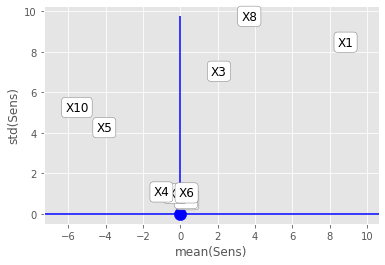

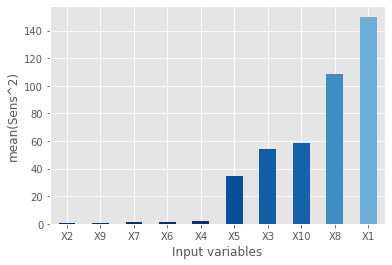

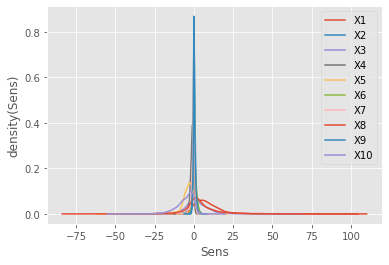

In [11]:
sensmlp.plot()

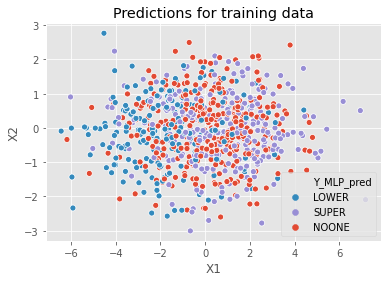

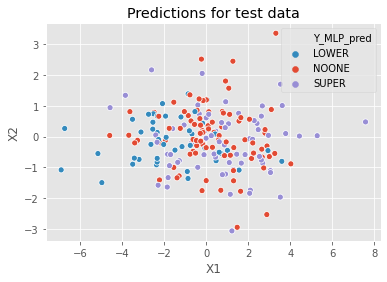

In [12]:
## Obtain a report of the model based on predictions ---------------------------------------------
dfTR_eval['Y_MLP_pred'] = MLP_fit.predict(X_train)
dfTR_eval['Y_MLP_prob_neg'] = MLP_fit.predict_proba(X_train)[:,0]
dfTR_eval['Y_MLP_prob_pos'] = MLP_fit.predict_proba(X_train)[:,1]
### Scale test using preprocess in training
dfTS_eval['Y_MLP_pred'] = MLP_fit.predict(X_test)
dfTS_eval['Y_MLP_prob_neg'] = MLP_fit.predict_proba(X_test)[:,0]
dfTS_eval['Y_MLP_prob_pos'] = MLP_fit.predict_proba(X_test)[:,1]

### Plot predictions of the model
palette = {'NOONE':'C0', 'LOWER':'C1', 'SUPER':'C2'} # Needed to maintain color palette 
sns.scatterplot(x='X1', y='X2', hue='Y_MLP_pred', data=dfTR_eval, palette=palette).set_title('Predictions for training data')
plt.show()
plt.figure() # Needed to plot two separated plots instead of two overlapped
sns.scatterplot(x='X1', y='X2', hue='Y_MLP_pred', data=dfTS_eval, palette=palette).set_title('Predictions for test data')
plt.show()


In [14]:
CT.confusion_matrix(dfTR_eval['Y'], dfTR_eval['Y_MLP_pred'])

Confusion Matrix and Statistics
	   Prediction
Reference  LOWER  SUPER  NOONE
    LOWER    203      0     34
    SUPER      0    278     22
    NOONE      5      2    256

Accuracy: 0.92
No Information Rate: 0.34
P-Value [Acc > NIR]: 0.0
Kappa: 0.88
Mcnemar's Test P-Value: 1.0



In [15]:
CT.confusion_matrix(dfTS_eval['Y'], dfTS_eval['Y_MLP_pred'])

Confusion Matrix and Statistics
	   Prediction
Reference  LOWER  NOONE  SUPER
    LOWER     45     15      0
    NOONE      2     60      4
    SUPER      0     12     63

Accuracy: 0.84
No Information Rate: 0.34
P-Value [Acc > NIR]: 0.0
Kappa: 0.75
Mcnemar's Test P-Value: 0.0

